同じ楽曲に対して，３つの類似したアルゴリズムを検証し，比較してゆく．

Repetitionはほぼすべての音楽に共通する特徴．
同じ数小節を繰り返すバックバンドの上で，トランペットが新しいメロディを即興で演奏するような感じ．
バッキングバンドの繰返しを利用して，トランペットを分離するということを考えることができる．
繰り返しのある背景とそうでない前景を分離するための３つのアルゴリズムを検討する．

ここから先の3つのアルゴリズムは，混合物のマグニチュード・スペクトログラムを入力し，
混合物の中の繰り返しを見つけ，前景と背景のマスクを作成することでそれらを分離しようとする．

REPETの概要

REpeating Pattern Extraction Technique（REPET）
  １繰り返しの時間を見つける
  ２スペクトログラムをｔ秒の長さのNセグメントに分轄する
  ３Nセグメントをオーバーレイする．
  ４N重ね合わせセグメントの中央値を取得し，中央値のマスクを作る．

In [6]:
!pip install git+https://github.com/source-separation/tutorial

  Cloning https://github.com/source-separation/tutorial to /tmp/pip-req-build-bcg_yo16
  Running command git clone -q https://github.com/source-separation/tutorial /tmp/pip-req-build-bcg_yo16
     |████████████████████████████████| 42 kB 859 kB/s 
     |████████████████████████████████| 8.6 MB 31.7 MB/s 
     |████████████████████████████████| 239 kB 62.4 MB/s 
     |████████████████████████████████| 47 kB 5.4 MB/s 
     |████████████████████████████████| 2.2 MB 48.5 MB/s 
     |████████████████████████████████| 51 kB 78 kB/s 
     |████████████████████████████████| 3.3 MB 42.8 MB/s 
     |████████████████████████████████| 56 kB 4.9 MB/s 
     |████████████████████████████████| 87 kB 7.9 MB/s 
     |████████████████████████████████| 206 kB 64.2 MB/s 
     |████████████████████████████████| 1.9 MB 43.5 MB/s 
     |████████████████████████████████| 88 kB 8.6 MB/s 
     |████████████████████████████████| 87 kB 8.1 MB/s 
     |████████████████████████████████| 290 kB 54.3 MB/s 
     |█████

In [7]:
!pip install SoX

In [8]:
# Do our imports
import warnings
warnings.simplefilter('ignore')
import nussl
import matplotlib.pyplot as plt
import numpy as np
from pprint import pprint
from common import viz

SoX could not be found!

    If you do not have SoX, proceed here:
     - - - http://sox.sourceforge.net/ - - -

    If you do (or think that you should) have SoX, double-check your
    path variables.
    


繰り返しの多いオーディオファイルをダウンロードして，聞いてみる．

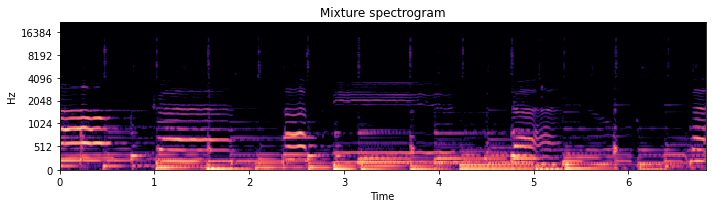

In [10]:
# This example is from MUSDB18. We will discuss this in a later section.
musdb = nussl.datasets.MUSDB18(download=True)
item = musdb[40]

# Get the mix and sources
mix = item['mix']
sources = item['sources']

# Listen to the audio
mix.embed_audio()

# Visualize the spectrogram
plt.figure(figsize=(10, 3))
plt.title('Mixture spectrogram')
nussl.utils.visualize_spectrogram(mix, y_axis='mel')
plt.tight_layout()
plt.show()

In [11]:
repet = nussl.separation.primitive.Repet(mix)
# Background and Foreground Masks
bg_mask, fg_mask = repet.run()
print(type(bg_mask))

<class 'nussl.core.masks.soft_mask.SoftMask'>


maskが作成できたので，それらをミックスに適用してみる

In [12]:
# Get the mask numpy arrays
bg_mask_arr = bg_mask.mask
fg_mask_arr = fg_mask.mask

# Multiply the masks to the magnitude spectrogram
mix.stft()
mix_mag_spec = mix.magnitude_spectrogram_data
bg_no_phase_spec = mix_mag_spec * bg_mask_arr
fg_no_phase_spec = mix_mag_spec * fg_mask_arr

# Make new AudioSignals for background and foreground without phase
bg_no_phase = mix.make_copy_with_stft_data(bg_no_phase_spec)
_ = bg_no_phase.istft()
fg_no_phase = mix.make_copy_with_stft_data(fg_no_phase_spec)
_ = fg_no_phase.istft()

In [13]:
print('REPET Background without Phase')
_ = bg_no_phase.embed_audio()

print('REPET Foreground without Phase')
_ = fg_no_phase.embed_audio()

REPET Background without Phase


REPET Foreground without Phase


微妙だ．．．　位相アーティファクトはforegroundでは明白である．

Mixture Phase


In [14]:
def apply_mask_with_noisy_phase(mix_stft, mask):
    mix_magnitude, mix_phase = np.abs(mix_stft), np.angle(mix_stft)
    src_magnitude = mix_magnitude * mask
    src_stft = src_magnitude * np.exp(1j * mix_phase)
    return src_stft

In [15]:
bg_stft = apply_mask_with_noisy_phase(mix.stft_data, bg_mask_arr)
fg_stft = apply_mask_with_noisy_phase(mix.stft_data, fg_mask_arr)


# Make new AudioSignals for background and foreground with phase
bg_phase = mix.make_copy_with_stft_data(bg_stft)
_ = bg_phase.istft()
fg_phase = mix.make_copy_with_stft_data(fg_stft)
_ = fg_phase.istft()

In [16]:
print('REPET Background with Phase')
_ = bg_phase.embed_audio()

print('REPET Foreground with Phase')
_ = fg_phase.embed_audio()

REPET Background with Phase


REPET Foreground with Phase


おお，これはいけるな．

In [17]:
# Will make AudioSignal objects after we're run the algorithm
repet = nussl.separation.primitive.Repet(mix)
repet.run()
repet_bg, repet_fg = repet.make_audio_signals()

# Will run the algorithm and return AudioSignals in one step
repet = nussl.separation.primitive.Repet(mix)
repet_bg, repet_fg = repet()

Evaluation

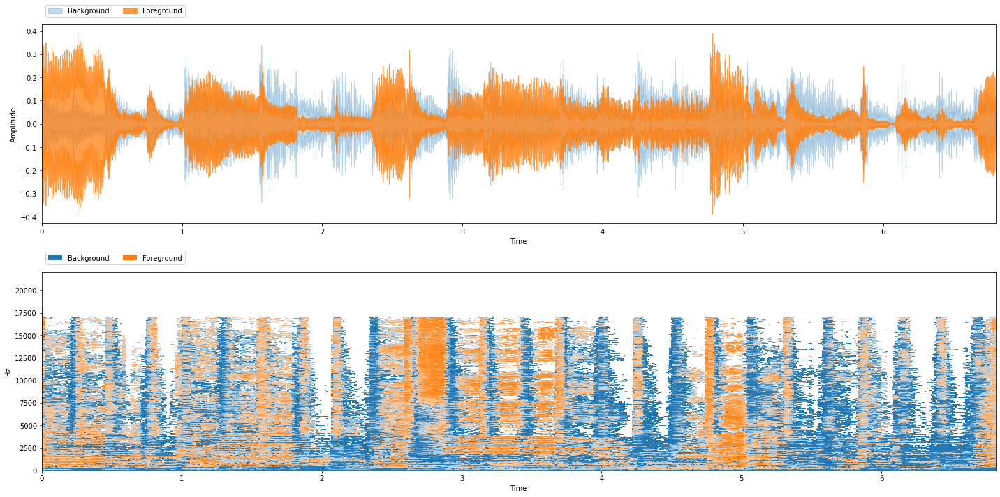


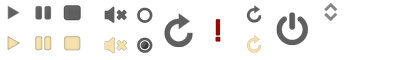
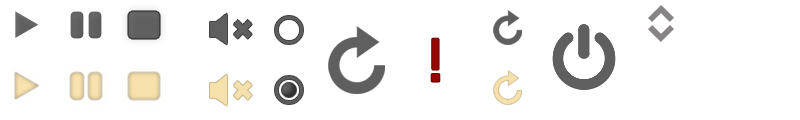
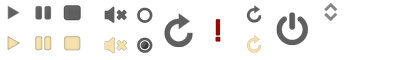

In [19]:
viz.show_sources({'Background': repet_bg, 'Foreground': repet_fg})

REPETもでるの評価．
モデルの出力を調べている．

In [20]:
# Mix the background sources together
gt_bg = sum(src for name, src in sources.items() if name != 'vocals')

gt_bg.path_to_input_file = 'background'  # Label for later

gt_fg = sources['vocals']
gt_fg.path_to_input_file = 'foreground'

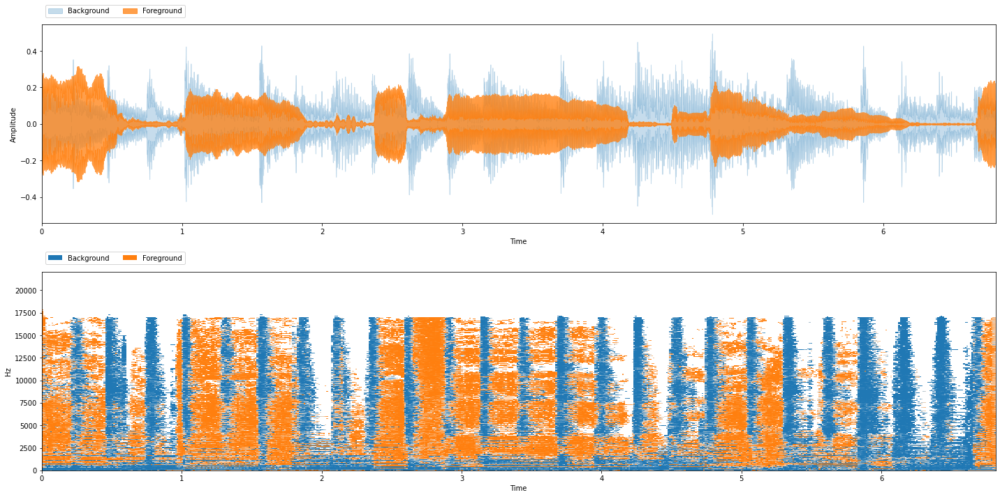


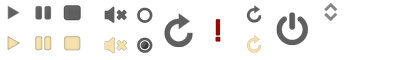
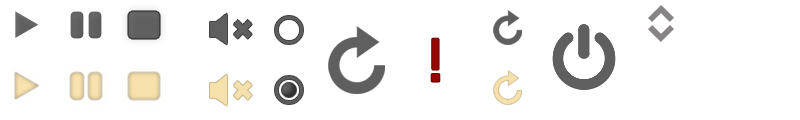
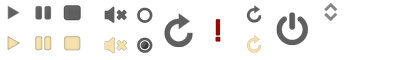

In [21]:
viz.show_sources({'Background': gt_bg, 'Foreground': gt_fg})

SDR & Friends

定量的に評価してみよう

SDRの評価関数はBSSEvslと呼ばれいる．

In [23]:
bss_eval = nussl.evaluation.BSSEvalScale(
    true_sources_list=[gt_bg, gt_fg],
    estimated_sources_list=[repet_bg, repet_fg]
)
repet_eval = bss_eval.evaluate()

# Inspect the evaluation
pprint(repet_eval)

{'background': {'MIX-SD-SDR': [3.9314831232234675, 5.336881694926657],
                'MIX-SI-SDR': [3.932129073730801, 5.337614286353903],
                'MIX-SNR': [3.8638559787236137, 5.275643734509963],
                'SD-SDR': [3.5220758723953356, 7.6128156481885245],
                'SD-SDRi': [-0.4094072508281319, 2.275933953261868],
                'SI-SAR': [6.279044690434819, 9.308070404907925],
                'SI-SDR': [5.750111670888234, 8.824659887630787],
                'SI-SDRi': [1.8179825971574335, 3.4870456012768845],
                'SI-SIR': [15.155730687012303, 18.59880553677377],
                'SNR': [6.58201457060274, 9.235432372210497],
                'SNRi': [2.7181585918791265, 3.959788637700534],
                'SRR': [7.4871927518943675, 13.748032403948262]},
 'combination': [0, 1],
 'foreground': {'MIX-SD-SDR': [-3.70013700252964, -5.071003563079052],
                'MIX-SI-SDR': [-3.6994910520223083, -5.070270971651808],
                'MIX-SNR'

In [24]:
def print_metrics(eval_dict):
    """Helper function to parse the eval dict"""
    
    # Take mean over channels
    result = f"foreground SI-SDR: {np.mean(eval_dict['foreground']['SI-SDR']):+.2f} dB\n" \
             f"background SI-SDR: {np.mean(eval_dict['background']['SI-SDR']):+.2f} dB\n\n" \
             f"foreground SI-SAR: {np.mean(eval_dict['foreground']['SI-SAR']):+.2f} dB\n" \
             f"background SI-SAR: {np.mean(eval_dict['background']['SI-SAR']):+.2f} dB\n\n" \
             f"foreground SI-SIR: {np.mean(eval_dict['foreground']['SI-SIR']):+.2f} dB\n" \
             f"background SI-SIR: {np.mean(eval_dict['background']['SI-SIR']):+.2f} dB\n"
    print(result)

print_metrics(repet_eval)

foreground SI-SDR: +1.95 dB
background SI-SDR: +7.29 dB

foreground SI-SAR: +3.85 dB
background SI-SAR: +7.79 dB

foreground SI-SIR: +6.66 dB
background SI-SIR: +16.88 dB



SDR:推定されたソースの全体的な品質
SAR:ソースに含まれる不自然なアーチファクトの数
SIR:各ソース推定値に含まれる他のソースからのおとのかず
値が高いほど良好である．

In [25]:
%%capture
# Comment out the line above to run this cell
# interactively in Colab or Jupyter Notebook

repet.interact(share=True, source='microphone')

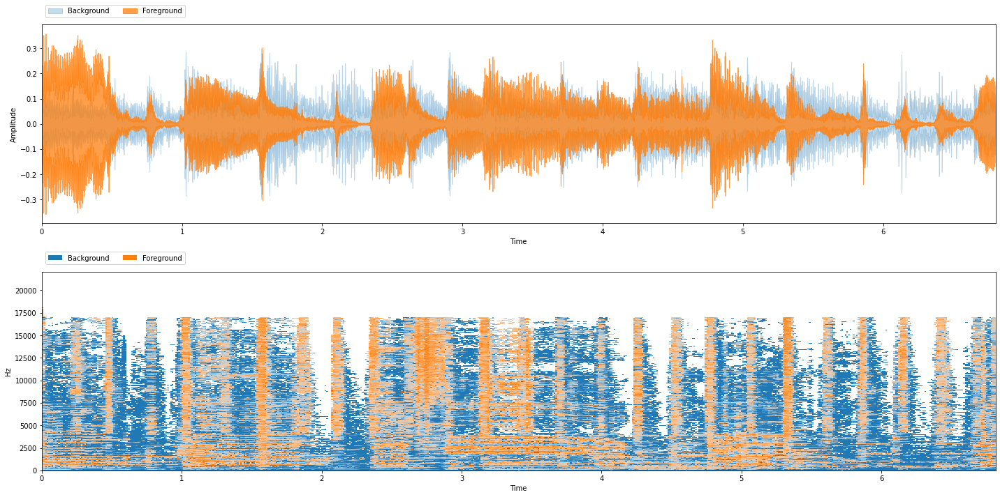


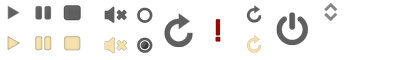
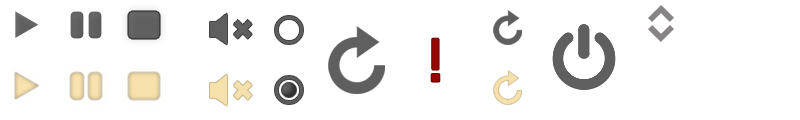
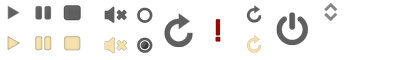

In [26]:
repet_sim = nussl.separation.primitive.RepetSim(mix)
rsim_bg, rsim_fg = repet_sim()

viz.show_sources({'Background': rsim_bg, 'Foreground': rsim_fg})

In [27]:
bss_eval = nussl.evaluation.BSSEvalScale(
    true_sources_list=[gt_bg, gt_fg],
    estimated_sources_list=[rsim_bg, rsim_fg]
)
rsim_eval = bss_eval.evaluate()
print_metrics(rsim_eval)

foreground SI-SDR: +2.00 dB
background SI-SDR: +7.66 dB

foreground SI-SAR: +3.92 dB
background SI-SAR: +8.52 dB

foreground SI-SIR: +6.63 dB
background SI-SIR: +15.08 dB



In [28]:
%%capture
# Comment out the line above to run this cell
# interactively in Colab or Jupyter Notebook

repet_sim.interact(share=True, source='microphone')

2DFT

スペクトログラムの二次元フーリエ変換を使って繰り返しのパターンと非繰り返しのパターンをみつけることもできます．
繰り返している部分はピークとして現れ，
繰り返していない部分はそれ以外の部分．

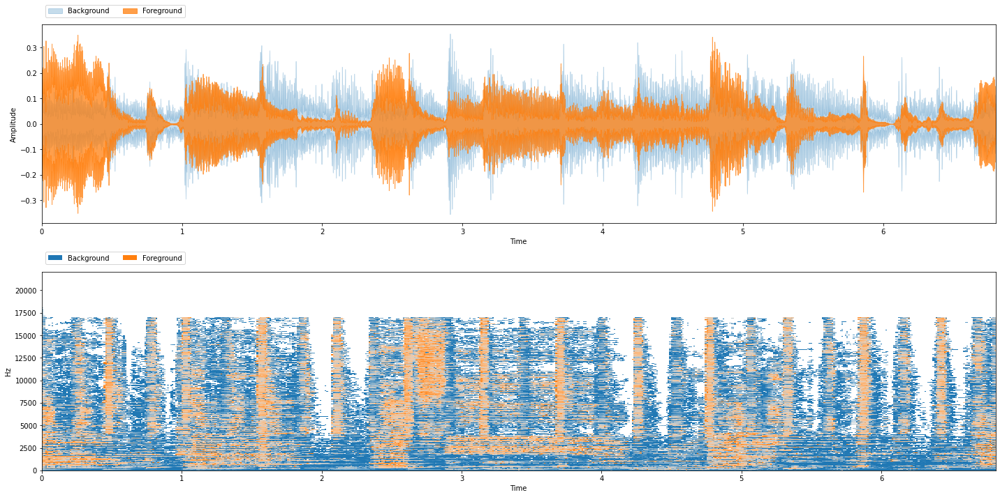


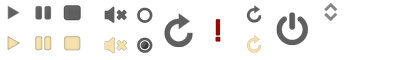
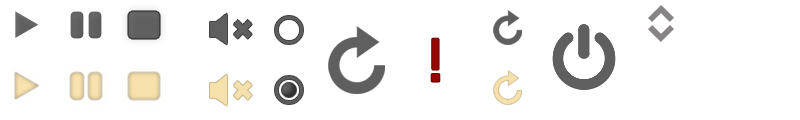
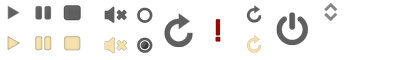

In [29]:
# We can't start a variable name with a number,
# so this object is called FT2D
ft2d = nussl.separation.primitive.FT2D(mix)
ft2d_bg, ft2d_fg = ft2d()

viz.show_sources({'Background': ft2d_bg, 'Foreground': ft2d_fg})

In [30]:
bss_eval = nussl.evaluation.BSSEvalScale(
    true_sources_list=[gt_bg, gt_fg],
    estimated_sources_list=[ft2d_bg, ft2d_fg]
)
ft2d_eval = bss_eval.evaluate()
print_metrics(ft2d_eval)

foreground SI-SDR: +1.50 dB
background SI-SDR: +7.46 dB

foreground SI-SAR: +3.45 dB
background SI-SAR: +8.83 dB

foreground SI-SIR: +6.11 dB
background SI-SIR: +13.15 dB



In [31]:
%%capture
# Comment out the line above to run this cell
# interactively in Colab or Jupyter Notebook

ft2d.interact(share=True, source='microphone')

In [32]:
print('REPET Metrics')
print('-------------')
print_metrics(repet_eval)
print('\n')

print('REPET-SIM Metrics')
print('-----------------')
print_metrics(rsim_eval)
print('\n')

print('2DFT Metrics')
print('------------')
print_metrics(ft2d_eval)

REPET Metrics
-------------
foreground SI-SDR: +1.95 dB
background SI-SDR: +7.29 dB

foreground SI-SAR: +3.85 dB
background SI-SAR: +7.79 dB

foreground SI-SIR: +6.66 dB
background SI-SIR: +16.88 dB



REPET-SIM Metrics
-----------------
foreground SI-SDR: +2.00 dB
background SI-SDR: +7.66 dB

foreground SI-SAR: +3.92 dB
background SI-SAR: +8.52 dB

foreground SI-SIR: +6.63 dB
background SI-SIR: +15.08 dB



2DFT Metrics
------------
foreground SI-SDR: +1.50 dB
background SI-SDR: +7.46 dB

foreground SI-SAR: +3.45 dB
background SI-SAR: +8.83 dB

foreground SI-SIR: +6.11 dB
background SI-SIR: +13.15 dB

